In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity

In [8]:
img = cv2.imread('../data/img.jpg')
img_wb = cv2.imread('../data/img_wb.jpg')

1. Зашумить изображение при помощи шума Гаусса и равномерного шума.



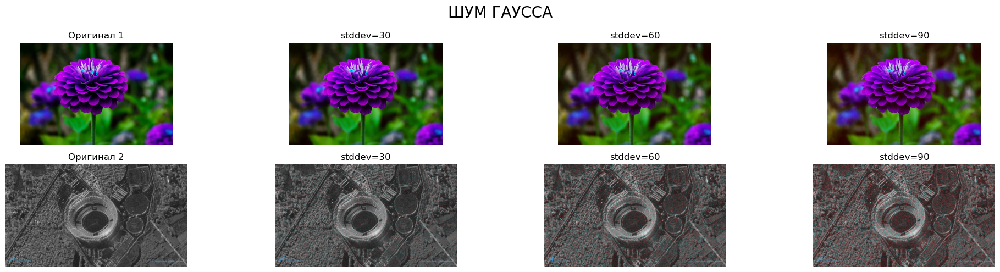

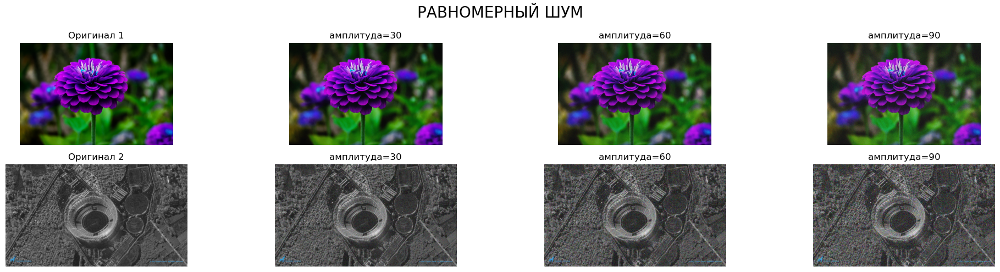

In [9]:
print("1. Зашумить изображение при помощи шума Гаусса и равномерного шума.\n")

stddev = [30, 60, 90]
mean = 0

def gauss(image, mean, sigma):
    noise = np.zeros(image.shape, dtype=np.float32)
    cv2.randn(noise, mean, sigma)
    noisy_image = image.astype(np.float32) + noise
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image.astype(np.uint8)

def uniform_noise(image, amplitude):
    noise = np.random.uniform(-amplitude, amplitude, image.shape).astype(np.float32)
    noisy_image = image.astype(np.float32) + noise
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image.astype(np.uint8)


plt.figure(figsize=(20, 5))
plt.subplot(2, 4, 1)
plt.imshow(img)
plt.title("Оригинал 1")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(img_wb)
plt.title("Оригинал 2")
plt.axis("off")

for i, s in enumerate(stddev):
    ng1 = gauss(img, mean, s)
    plt.subplot(2, 4, i+2)
    plt.imshow(ng1, cmap="gray")
    plt.title(f"stddev={s}")
    plt.axis('off')

    ng2 = gauss(img_wb, mean, s)
    plt.subplot(2, 4, i+6)
    plt.imshow(ng2, cmap="gray")
    plt.title(f"stddev={s}")
    plt.axis('off')

img_n1 = ng1
img_n2 = ng2

plt.suptitle("ШУМ ГАУССА", fontsize=20)
plt.tight_layout()
plt.show()
print(" ")


plt.figure(figsize=(20, 5))
plt.subplot(2, 4, 1)
plt.imshow(img)
plt.title("Оригинал 1")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(img_wb)
plt.title("Оригинал 2")
plt.axis("off")

for i, a in enumerate(stddev):
    nu1 = uniform_noise(img, a)
    plt.subplot(2, 4, i+2)
    plt.imshow(nu1, cmap="gray")
    plt.title(f"амплитуда={a}")
    plt.axis('off')

    nu2 = uniform_noise(img_wb, a)
    plt.subplot(2, 4, i+6)
    plt.imshow(nu2, cmap="gray")
    plt.title(f"амплитуда={a}")
    plt.axis('off')

plt.suptitle("РАВНОМЕРНЫЙ ШУМ", fontsize=20)
plt.tight_layout()
plt.show()

2. Протестировать медианный фильтр, фильтр гаусса, билатериальный фильтр,
 фильтр нелокальных средних с различными параметрами.


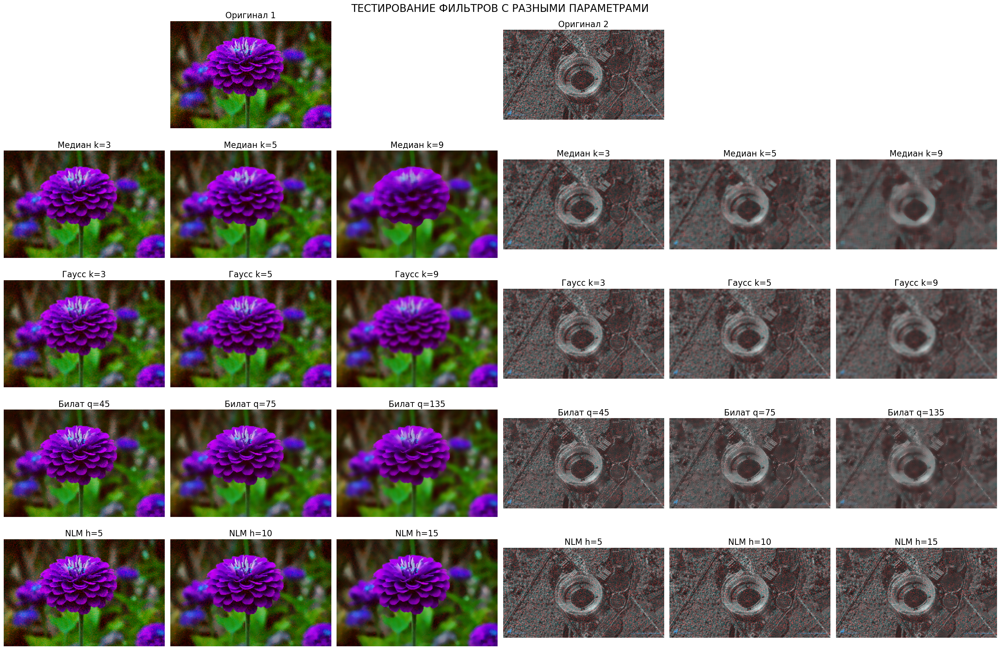

In [10]:
print("2. Протестировать медианный фильтр, фильтр гаусса, билатериальный фильтр,\n фильтр нелокальных средних с различными параметрами.")

plt.figure(figsize=(27, 18))

def resize_for_processing(image, max_size=300):
    h, w = image.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        return cv2.resize(image, (new_w, new_h))
    return image

img_small = resize_for_processing(img_n1)
img_wb_small = resize_for_processing(img_n2)

if img_small.dtype != 'uint8':
    img_small = (img_small * 255).astype('uint8')
if img_wb_small.dtype != 'uint8':
    img_wb_small = (img_wb_small * 255).astype('uint8')

k = [3, 5, 9]

plt.subplot(5, 6, 2)
plt.imshow(img_small)
plt.title("Оригинал 1", fontsize=16)
plt.axis("off")

plt.subplot(5, 6, 4)
plt.imshow(img_wb_small, cmap="gray")
plt.title("Оригинал 2", fontsize=16)
plt.axis("off")

for i in range(len(k)):
    m1 = cv2.medianBlur(img_small, k[i])
    plt.subplot(5, 6, i+7)
    plt.imshow(m1)
    plt.title(f"Медиан k={k[i]}", fontsize=16)
    plt.axis('off')

    m2 = cv2.medianBlur(img_wb_small, k[i])
    plt.subplot(5, 6, i+10)
    plt.imshow(m2, cmap="gray")
    plt.title(f"Медиан k={k[i]}", fontsize=16)
    plt.axis('off')

for i in range(len(k)):
    g1 = cv2.GaussianBlur(img_small, (k[i], k[i]), 0)
    plt.subplot(5, 6, i+13)
    plt.imshow(g1)
    plt.title(f"Гаусс k={k[i]}", fontsize=16)
    plt.axis('off')

    g2 = cv2.GaussianBlur(img_wb_small, (k[i], k[i]), 0)
    plt.subplot(5, 6, i+16)
    plt.imshow(g2, cmap="gray")
    plt.title(f"Гаусс k={k[i]}", fontsize=16)
    plt.axis('off')

for i in range(len(k)):
    b1 = cv2.bilateralFilter(img_small, 9, k[i]*15, k[i]*15)
    plt.subplot(5, 6, i+19)
    plt.imshow(b1)
    plt.title(f"Билат q={k[i]*15}", fontsize=16)
    plt.axis('off')

    b2 = cv2.bilateralFilter(img_wb_small, 9, k[i]*15, k[i]*15)
    plt.subplot(5, 6, i+22)
    plt.imshow(b2, cmap="gray")
    plt.title(f"Билат q={k[i]*15}", fontsize=16)
    plt.axis('off')

nl_params = [5, 10, 15]
for i in range(len(k)):
    f1 = cv2.fastNlMeansDenoisingColored(img_small, None, nl_params[i], nl_params[i], 3, 7)
    plt.subplot(5, 6, i+25)
    plt.imshow(f1)
    plt.title(f"NLM h={nl_params[i]}", fontsize=16)
    plt.axis('off')

    f2 = cv2.fastNlMeansDenoising(img_wb_small, None, nl_params[i], 3, 7)
    plt.subplot(5, 6, i+28)
    plt.imshow(f2, cmap="gray")
    plt.title(f"NLM h={nl_params[i]}", fontsize=16)
    plt.axis('off')

plt.suptitle("ТЕСТИРОВАНИЕ ФИЛЬТРОВ С РАЗНЫМИ ПАРАМЕТРАМИ", fontsize=20)
plt.tight_layout()
plt.show()

3. Выяснить, какой фильтр показал лучший результат фильтрации (для гауссова и равномерного шума).

Гауссов шум:
Оптимальный по MSE: Билатеральный q=45
  MSE=181.81, SSIM=0.9363
Оптимальный по SSIM: NLM h=5
  MSE=250.04, SSIM=0.9493

Равномерный шум:
Оптимальный по MSE: Билатеральный q=45
  MSE=150.42, SSIM=0.8903
Оптимальный по SSIM: Билатеральный q=75
  MSE=218.37, SSIM=0.8903

Результаты всех фильтров для гауссова шума:
Медианный k=3: MSE=422.99, SSIM=0.8896
Медианный k=5: MSE=462.55, SSIM=0.8569
Медианный k=9: MSE=594.65, SSIM=0.7709
Гаусс k=3: MSE=309.30, SSIM=0.9121
Гаусс k=5: MSE=373.30, SSIM=0.8845
Гаусс k=9: MSE=473.91, SSIM=0.8315
Билатеральный q=45: MSE=181.81, SSIM=0.9363
Билатеральный q=75: MSE=225.07, SSIM=0.9141
Билатеральный q=135: MSE=333.23, SSIM=0.8724
NLM h=5: MSE=250.04, SSIM=0.9493
NLM h=10: MSE=225.68, SSIM=0.9286
NLM h=15: MSE=239.48, SSIM=0.9062

Результаты всех фильтров для равномерного шума:
Медианный k=3: MSE=440.18, SSIM=0.7825
Медианный k=5: MSE=472.76, SSI

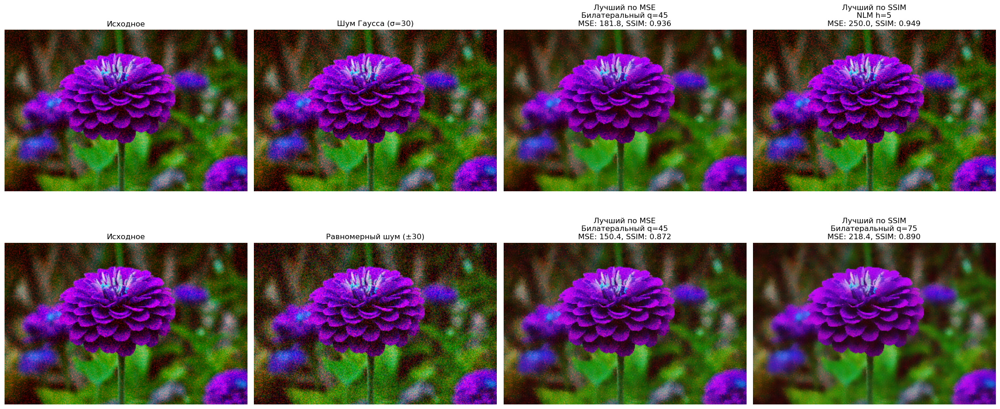

In [11]:
print("3. Выяснить, какой фильтр показал лучший результат фильтрации (для гауссова и равномерного шума).")

try:
    k
except NameError:
    k = [3, 5, 7]
try:
    nl_params
except NameError:
    nl_params = [5, 7, 10]

try:
    img_clean = img_small
except NameError:
    img_clean = img

def gauss(image, mean=0, sigma=30):
    noise = np.zeros(image.shape, dtype=np.float32)
    cv2.randn(noise, mean, sigma)
    out = image.astype(np.float32) + noise
    return np.clip(out, 0, 255).astype(np.uint8)

def uniform_noise(image, amplitude=30):
    noise = np.random.uniform(-amplitude, amplitude, size=image.shape).astype(np.float32)
    out = image.astype(np.float32) + noise
    return np.clip(out, 0, 255).astype(np.uint8)

def calculate_metrics(original, filtered):
    mse = np.mean((original.astype(float) - filtered.astype(float)) ** 2)
    if len(original.shape) == 3:
        original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
        filtered_gray = cv2.cvtColor(filtered, cv2.COLOR_BGR2GRAY)
    else:
        original_gray = original
        filtered_gray = filtered
    ssim = structural_similarity(original_gray, filtered_gray)
    return mse, ssim

def run_filters_and_metrics(img_clean, img_noisy, k_list, nl_list):
    results = {}

    for ks in k_list:
        ks = int(ks) if int(ks) % 2 == 1 else int(ks) + 1
        m_img = cv2.medianBlur(img_noisy, ks)
        mse, ssim = calculate_metrics(img_clean, m_img)
        results[f'Медианный k={ks}'] = {'image': m_img, 'mse': mse, 'ssim': ssim}

    for ks in k_list:
        ks = int(ks) if int(ks) % 2 == 1 else int(ks) + 1
        g_img = cv2.GaussianBlur(img_noisy, (ks, ks), 0)
        mse, ssim = calculate_metrics(img_clean, g_img)
        results[f'Гаусс k={ks}'] = {'image': g_img, 'mse': mse, 'ssim': ssim}

    for ks in k_list:
        b_img = cv2.bilateralFilter(img_noisy, d=9, sigmaColor=ks*15, sigmaSpace=ks*15)
        mse, ssim = calculate_metrics(img_clean, b_img)
        results[f'Билатеральный q={ks*15}'] = {'image': b_img, 'mse': mse, 'ssim': ssim}

    color = (len(img_noisy.shape) == 3 and img_noisy.shape[2] == 3)
    for h in nl_list:
        if color:
            n_img = cv2.fastNlMeansDenoisingColored(img_noisy, None, h, h, 3, 7)
        else:
            n_img = cv2.fastNlMeansDenoising(img_noisy, None, h, 7, 21)
        mse, ssim = calculate_metrics(img_clean, n_img)
        results[f'NLM h={h}'] = {'image': n_img, 'mse': mse, 'ssim': ssim}

    return results

def select_optimal_filter_by_mse(filter_results):
    optimal = None
    for method_name, metrics in filter_results.items():
        if (optimal is None or 
            metrics['mse'] < optimal['mse_value'] or
            (metrics['mse'] == optimal['mse_value'] and metrics['ssim'] > optimal['ssim_value'])):
            optimal = {
                'method': method_name,
                'filtered_image': metrics['image'],
                'mse_value': metrics['mse'],
                'ssim_value': metrics['ssim']
            }
    return optimal

def select_optimal_filter_by_ssim(filter_results):
    optimal = None
    for method_name, metrics in filter_results.items():
        if (optimal is None or 
            metrics['ssim'] > optimal['ssim_value'] or
            (metrics['ssim'] == optimal['ssim_value'] and metrics['mse'] < optimal['mse_value'])):
            optimal = {
                'method': method_name,
                'filtered_image': metrics['image'],
                'mse_value': metrics['mse'],
                'ssim_value': metrics['ssim']
            }
    return optimal

sigma_g = 30
amp_u = 30
img_noisy_gauss = gauss(img_clean, mean=0, sigma=sigma_g)
img_noisy_uniform = uniform_noise(img_clean, amplitude=amp_u)

results_gauss = run_filters_and_metrics(img_clean, img_noisy_gauss, k, nl_params)
results_uniform = run_filters_and_metrics(img_clean, img_noisy_uniform, k, nl_params)

best_mse_gauss = select_optimal_filter_by_mse(results_gauss)
best_ssim_gauss = select_optimal_filter_by_ssim(results_gauss)

best_mse_uniform = select_optimal_filter_by_mse(results_uniform)
best_ssim_uniform = select_optimal_filter_by_ssim(results_uniform)

print("\nГауссов шум:")
print(f"Оптимальный по MSE: {best_mse_gauss['method']}")
print(f"  MSE={best_mse_gauss['mse_value']:.2f}, SSIM={best_mse_gauss['ssim_value']:.4f}")
print(f"Оптимальный по SSIM: {best_ssim_gauss['method']}")
print(f"  MSE={best_ssim_gauss['mse_value']:.2f}, SSIM={best_ssim_gauss['ssim_value']:.4f}")

print("\nРавномерный шум:")
print(f"Оптимальный по MSE: {best_mse_uniform['method']}")
print(f"  MSE={best_mse_uniform['mse_value']:.2f}, SSIM={best_ssim_uniform['ssim_value']:.4f}")
print(f"Оптимальный по SSIM: {best_ssim_uniform['method']}")
print(f"  MSE={best_ssim_uniform['mse_value']:.2f}, SSIM={best_ssim_uniform['ssim_value']:.4f}")

print("\nРезультаты всех фильтров для гауссова шума:")
print("=" * 40)
for method, metrics in results_gauss.items():
    print(f"{method}: MSE={metrics['mse']:.2f}, SSIM={metrics['ssim']:.4f}")
print("=" * 40)

print("\nРезультаты всех фильтров для равномерного шума:")
print("=" * 40)
for method, metrics in results_uniform.items():
    print(f"{method}: MSE={metrics['mse']:.2f}, SSIM={metrics['ssim']:.4f}")
print("=" * 40)

is_gray = (len(img_clean.shape) == 2) or (len(img_clean.shape) == 3 and img_clean.shape[2] == 1)
cmap = 'gray' if is_gray else None

plt.figure(figsize=(22, 10))

plt.subplot(2, 4, 1)
try:
    plt.imshow(resize_for_processing(img_clean), cmap=cmap)
except NameError:
    plt.imshow(img_clean, cmap=cmap)
plt.title('Исходное')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(img_noisy_gauss, cmap=cmap)
plt.title(f'Шум Гаусса (σ={sigma_g})')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(best_mse_gauss['filtered_image'], cmap=cmap)
plt.title(f'Лучший по MSE\n{best_mse_gauss["method"]}\nMSE: {best_mse_gauss["mse_value"]:.1f}, SSIM: {best_mse_gauss["ssim_value"]:.3f}')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(best_ssim_gauss['filtered_image'], cmap=cmap)
plt.title(f'Лучший по SSIM\n{best_ssim_gauss["method"]}\nMSE: {best_ssim_gauss["mse_value"]:.1f}, SSIM: {best_ssim_gauss["ssim_value"]:.3f}')
plt.axis('off')

plt.subplot(2, 4, 5)
try:
    plt.imshow(resize_for_processing(img_clean), cmap=cmap)
except NameError:
    plt.imshow(img_clean, cmap=cmap)
plt.title('Исходное')
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(img_noisy_uniform, cmap=cmap)
plt.title(f'Равномерный шум (±{amp_u})')
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(best_mse_uniform['filtered_image'], cmap=cmap)
plt.title(f'Лучший по MSE\n{best_mse_uniform["method"]}\nMSE: {best_mse_uniform["mse_value"]:.1f}, SSIM: {best_mse_uniform["ssim_value"]:.3f}')
plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(best_ssim_uniform['filtered_image'], cmap=cmap)
plt.title(f'Лучший по SSIM\n{best_ssim_uniform["method"]}\nMSE: {best_ssim_uniform["mse_value"]:.1f}, SSIM: {best_ssim_uniform["ssim_value"]:.3f}')
plt.axis('off')

plt.tight_layout()
plt.show()